In [1]:
import json
import h5py
import tqdm
import datetime
import time
import pandas as pd
import numpy as np

import importlib
import sys
sys.path.insert(0, '/cndd/fangming/CEMBA/snmcseq_dev')
sys.path.insert(0, '/cndd2/fangming/projects/SingleCellRoutines')

import __init__plots
importlib.reload(__init__plots)
from __init__plots import *

import snmcseq_utils
importlib.reload(snmcseq_utils)

import utils
importlib.reload(utils)

<module 'utils' from '/cndd2/fangming/projects/SingleCellRoutines/utils.py'>

In [2]:
today = datetime.date.today()
figures = '../figures/{}_{{}}'.format(today)
figures

'../figures/2021-05-22_{}'

# read in processed data

In [3]:
# palette as json
file = '../data/palette.json'
with open(file, 'r') as f:
    palette = json.load(f)
palette

{'Slice1_Replicate1': [0.19215686274509805,
  0.5098039215686274,
  0.7411764705882353],
 'Slice1_Replicate2': [0.4196078431372549,
  0.6823529411764706,
  0.8392156862745098],
 'Slice1_Replicate3': [0.6196078431372549,
  0.792156862745098,
  0.8823529411764706],
 'Slice2_Replicate1': [0.9019607843137255,
  0.3333333333333333,
  0.050980392156862744],
 'Slice2_Replicate2': [0.9921568627450981,
  0.5529411764705883,
  0.23529411764705882],
 'Slice2_Replicate3': [0.9921568627450981,
  0.6823529411764706,
  0.4196078431372549],
 'Slice3_Replicate1': [0.19215686274509805,
  0.6392156862745098,
  0.32941176470588235],
 'Slice3_Replicate2': [0.4549019607843137,
  0.7686274509803922,
  0.4627450980392157],
 'Slice3_Replicate3': [0.6313725490196078,
  0.8509803921568627,
  0.6078431372549019]}

In [4]:
f = '../data/clustering_embedding_S2R1_S1R2_2021-05-22.tsv.gz'
clsts = pd.read_csv(f, sep='\t').set_index('cell')
print(clsts.shape)
clsts.head()

(162767, 4)


,cluster,umap_1,umap_2,sample
cell,,,,
149164679103246548309819743981609972453,C4,4.724523,2.552570,Slice2_Replicate1
237155298815097057940587033798543926454,C3,5.027423,7.259142,Slice2_Replicate1
117749472799775376881672023779789020086,C16,5.544142,5.652046,Slice2_Replicate1
15016935204501029374284305801070750441,C18,7.309008,9.485803,Slice2_Replicate1
167702564287808924695032218174386816671,C16,5.740362,7.174219,Slice2_Replicate1


In [5]:
input = '../data/processed_vizgen_merfish_may22_2021.hdf5'
samples = [
#     'Slice1_Replicate1',
    'Slice1_Replicate2',
#     'Slice1_Replicate3',
    
    'Slice2_Replicate1',
#     'Slice2_Replicate2',
#     'Slice2_Replicate3',
    
#     'Slice3_Replicate1',
#     'Slice3_Replicate2',
#     'Slice3_Replicate3',
]

samples_shortname = "_".join([
    sample.replace('Slice', 'S').replace('_Replicate', 'R')
    for sample in samples
])

for sample in samples:
    gmat = []
    meta = []
    for sample in samples:
        _gmat = pd.read_hdf(input, 'mat_'+sample)
        gmat.append(_gmat)
        _meta = pd.read_hdf(input, 'meta_'+sample)
        _meta['sample'] = sample 
        meta.append(_meta)
gmat = pd.concat(gmat)
meta = pd.concat(meta)


In [6]:
# informations

thedata = clsts.drop('sample', axis=1).join(meta) #.join(clsts)
genes = gmat.columns
print(len(genes), gmat.shape, meta.shape)

483 (162767, 483) (162767, 13)


# plotting functions

In [7]:
def plot_umap_routine(ax, x, y, hue, toplot, palette=None, legend=False, title='', fontsize=12):
    """
    """
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    hue_order=np.sort(toplot[hue].unique()),
                    palette=palette,
                    s=2, 
                    alpha=0.9,
                    linewidth=0, 
                    rasterized=True, 
                    legend=legend, 
                    ax=ax,
                   )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)

    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'UMAP', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # # arrows
    return 

def plot_spatial_routine(ax, x, y, hue, toplot, palette=None, legend=False, title='', fontsize=12):
    """
    """
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    hue_order=np.sort(toplot[hue].unique()),
                    palette=palette,
                    s=2, 
                    alpha=0.9,
                    linewidth=0, 
                    rasterized=True, 
                    legend=legend, 
                    ax=ax,
                   )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)
    
    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'In situ', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # end arrows
    
    # scale bar
    length = 1000
    left = 3500
    length, left = 1000, 3500 
    ax.hlines(0.01, left, left+length, color='k', linewidth=3, 
              transform=ax.get_xaxis_transform())
    ax.text(left+length, 0, '1 mm', 
            va='top', ha='right', 
            transform=ax.get_xaxis_transform(),
            fontsize=fontsize)
    # end scale bar
    return



In [8]:
def plot_continuous_umap_routine(
    ax, x, y, hue, toplot, vmaxp=99, palette=None, title='', fontsize=12, pth=50):
    """
    # colorbar
    norm = plt.Normalize(0, vmaxp)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm,)
    fig.colorbar(sm, cax=cax, label='Percentile', ticks=[0, vmaxp])
    """
    vmin, vmax = 0, np.percentile(toplot[hue], vmaxp)
    cmap = sns.cubehelix_palette(as_cmap=True)
    pth = np.percentile(toplot[hue], pth)
    
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    s=1, 
                    alpha=0.3,
                    linewidth=0, 
                    legend=False, 
                    rasterized=True, 
                    vmin=vmin, 
                    vmax=vmax,
                    palette=cmap,
                    ax=ax,
                   )
    g = sns.scatterplot(x=x, y=y, hue=hue, data=toplot[toplot[hue]>pth], 
                        s=3, 
                        alpha=1,
                        linewidth=0, 
                        legend=False,
                        rasterized=True, 
                        vmin=vmin, 
                        vmax=vmax,
                        palette=cmap,
                        ax=ax,
                       )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)

    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'UMAP', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # # arrows
    return 

def plot_continuous_spatial_routine(
    ax, x, y, hue, toplot, vmaxp=99, palette=None, title='', fontsize=12):
    """
    # colorbar
    norm = plt.Normalize(0, vmaxp)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm,)
    fig.colorbar(sm, cax=cax, label='Percentile', ticks=[0, vmaxp])
    """
    vmin, vmax = 0, np.percentile(toplot[hue], vmaxp)
    cmap = sns.cubehelix_palette(as_cmap=True)
    
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    s=1, 
                    alpha=0.3,
                    linewidth=0, 
                    legend=False, 
                    rasterized=True, 
                    vmin=vmin, 
                    vmax=vmax,
                    palette=cmap,
                    ax=ax,
                   )
    g = sns.scatterplot(x=x, y=y, hue=hue, data=toplot[toplot[hue]>0], 
                        s=3, 
                        alpha=1,
                        linewidth=0, 
                        legend=False,
                        rasterized=True, 
                        vmin=vmin, 
                        vmax=vmax,
                        palette=cmap,
                        ax=ax,
                       )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)
    
    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'In situ', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # end arrows
    
    # scale bar
    length = 1000
    left = 3500
    length, left = 1000, 3500 
    ax.hlines(0.01, left, left+length, color='k', linewidth=3, 
              transform=ax.get_xaxis_transform())
    ax.text(left+length, 0, '1 mm', 
            va='top', ha='right', 
            transform=ax.get_xaxis_transform(),
            fontsize=fontsize)
    # end scale bar
    return

In [9]:
# unify cluster palette 
# cmap chage
uniq_clsts = np.sort(clsts['cluster'].unique())
colors = sns.color_palette('husl', len(uniq_clsts))
palette_clsts = {clst: color for clst, color in zip(uniq_clsts, colors)}

../figures/2021-05-22_in_situ_by_clusters_Slice2_Replicate1.pdf
../figures/2021-05-22_in_situ_by_clusters_Slice2_Replicate1.png


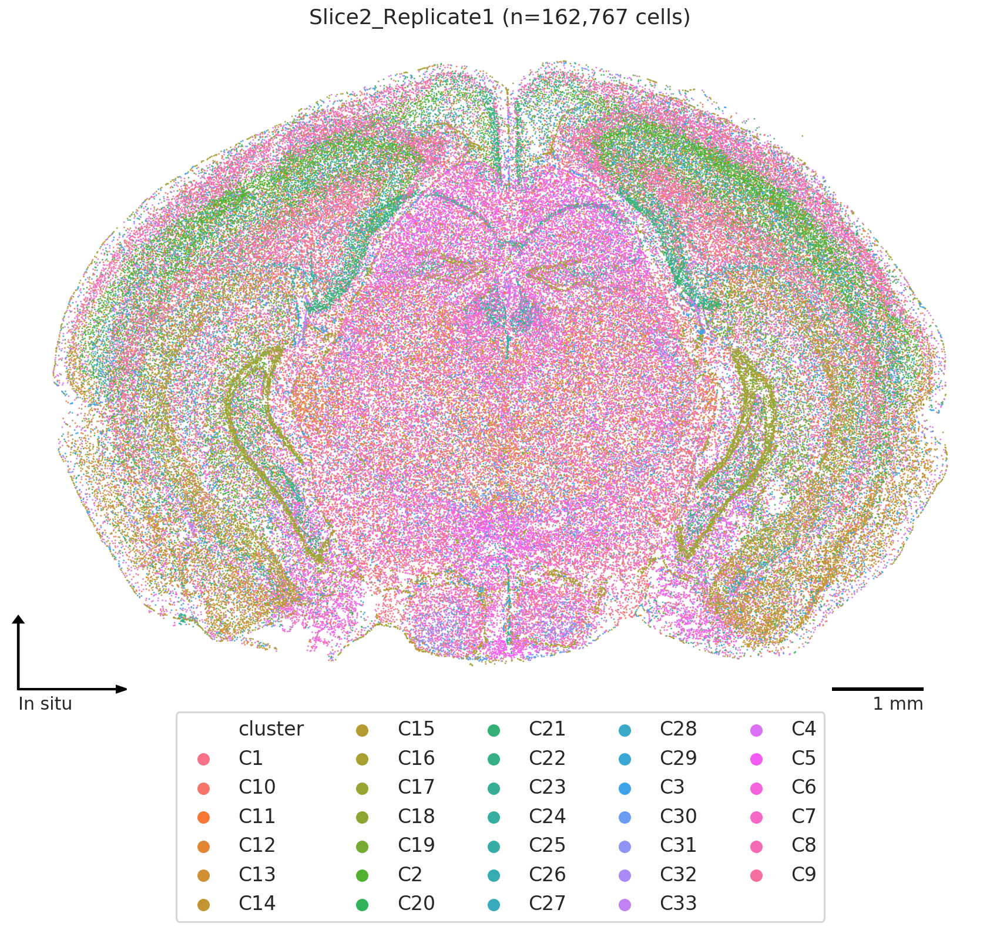

In [10]:
output1 = figures.format('in_situ_by_clusters_{}.pdf'.format(sample))
output2 = figures.format('in_situ_by_clusters_{}.png'.format(sample))

x, y, hue = 'x', 'y', 'cluster'
toplot = thedata
title = '{} (n={:,} cells)'.format(sample, len(toplot))
legend = 'full'
palette = palette_clsts
figsize = (15, 12)
fontsize = 15

fig, ax = plt.subplots(figsize=figsize)
plot_spatial_routine(ax, x, y, hue, toplot, palette, legend=legend, title=title, fontsize=fontsize)
ax.legend(bbox_to_anchor=(0.5,-0.01), loc='upper center', ncol=5)

for output in [output1, output2]:
    print(output)
    snmcseq_utils.savefig(fig, output)
    
plt.show()

../figures/2021-05-22_umap_by_clusters_Slice2_Replicate1.pdf
../figures/2021-05-22_umap_by_clusters_Slice2_Replicate1.png


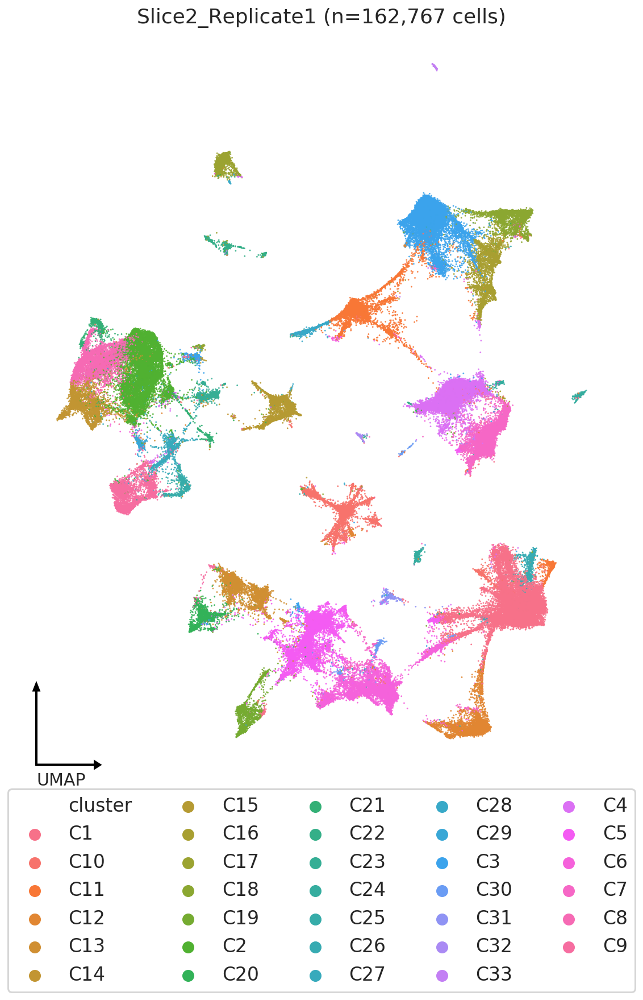

In [11]:
output1 = figures.format('umap_by_clusters_{}.pdf'.format(sample))
output2 = figures.format('umap_by_clusters_{}.png'.format(sample))

x, y, hue = 'umap_1', 'umap_2', 'cluster'
toplot = thedata
title = '{} (n={:,} cells)'.format(sample, len(toplot))
legend = 'full'
palette = palette_clsts
figsize = (10, 12)
fontsize = 15

fig, ax = plt.subplots(figsize=figsize)
plot_umap_routine(ax, x, y, hue, toplot, palette, legend=legend, title=title, fontsize=fontsize)
ax.legend(bbox_to_anchor=(0.5,-0.01), loc='upper center', ncol=5)

for output in [output1, output2]:
    print(output)
    snmcseq_utils.savefig(fig, output)
plt.show()

## visualize each cluster (downsample)

In [12]:
# subsamp

nsample = 20000
toplot_subsamp = thedata.sample(n=nsample)

print(toplot_subsamp.shape)
toplot_subsamp.head()

(20000, 16)


,cluster,umap_1,umap_2,x,y,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,cell_cov,cell_cov_norm,sample
cell,,,,,,,,,,,,,,,,
77212416242986956464877244171145496500,C14,-10.609542,1.695724,2585.703703,-2679.164991,1045,110.697548,5510.035861,8588.877543,5506.353061,5513.718661,8584.600742,8593.154343,69.0,427.916646,Slice1_Replicate2
180762921852146080049067686857106023006,C1,7.179780,-6.248988,-1431.231669,-159.972850,1010,304.862392,5433.676443,3847.963278,5429.129643,5438.223243,3842.390478,3853.536078,111.0,249.958101,Slice1_Replicate2
10702428679984010687260117071789376797,C2,-7.296826,3.671424,579.132733,2965.381513,718,789.146886,5147.001193,747.644024,5141.487793,5152.514593,740.991224,754.296824,287.0,290.343795,Slice2_Replicate1
52982935222740959475319590300669412564,C2,-8.137815,2.123879,1402.765602,1863.695020,253,538.376967,2235.316941,5225.377041,2229.906141,2240.727741,5219.750241,5231.003841,222.0,283.083524,Slice1_Replicate2
176089668710919706062986150488981899805,C8,-9.176280,3.979150,-3411.233926,1857.039180,1293,1135.824982,8712.343693,2854.722964,8706.716893,8717.970493,2845.262164,2864.183764,458.0,321.915999,Slice2_Replicate1


/cndd2/fangming/venvs/routine/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/cndd2/fangming/venvs/routine/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


../figures/2021-05-22_in_situ_umap_by_clusters_Slice2_Replicate1_C1.pdf
../figures/2021-05-22_in_situ_umap_by_clusters_Slice2_Replicate1_C1.png


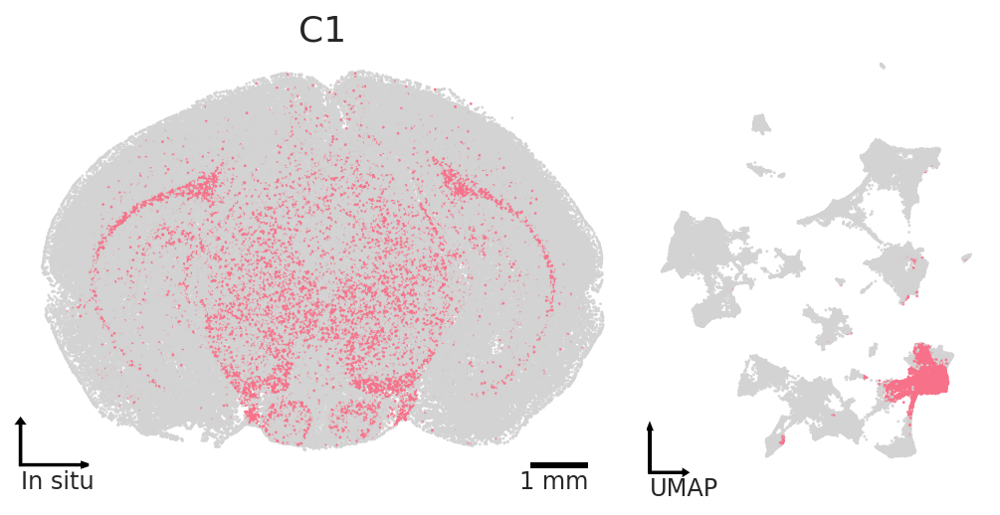

In [13]:
x_spatial, y_spatial = 'x', 'y'
x_umap, y_umap = 'umap_1', 'umap_2'
hue = 'cluster'
legend = False
fontsize = 12

# n = len(uniq_clsts)
for i, clst in enumerate(uniq_clsts):
    output1 = figures.format('in_situ_umap_by_clusters_{}_{}.pdf'.format(sample, clst))
    output2 = figures.format('in_situ_umap_by_clusters_{}_{}.png'.format(sample, clst))
    
    fig, axs_row = plt.subplots(1, 2, figsize=(5*2,4*1))
    title = '{}'.format(clst)
    palette_specific = {_clst: palette_clsts[_clst] if _clst == clst else "lightgray" 
                        for _clst in uniq_clsts} 
    ax = axs_row[0]
    plot_spatial_routine(
        ax, x_spatial, y_spatial, hue, toplot, 
        palette_specific, legend=legend, title=title, fontsize=fontsize,
    )
    ax = axs_row[1]
    plot_umap_routine(
        ax, x_umap, y_umap, hue, toplot, 
        palette_specific, legend=legend, title='', fontsize=fontsize,
    )
    fig.subplots_adjust(wspace=-0.2)
    
    for output in [output1, output2]:
        print(output)
        snmcseq_utils.savefig(fig, output)
    plt.show()
    break

## hippocampus cell types and genes
- C19,21
- DKL1, DRD1, DRD2, FN1, HTR2C, TRHR

In [14]:
curated_genes = snmcseq_utils.read_googlesheet('curated_gene_list', 'genes_organized')
print(curated_genes.shape)
curated_genes = curated_genes[curated_genes['gene_name']!='']
print(curated_genes.shape)
overlaped_genes = np.intersect1d(curated_genes['gene_name'], genes.map(lambda x: x.upper()))
curated_genes = curated_genes[curated_genes['gene_name'].isin(overlaped_genes)]
print(curated_genes.shape)

curated_genes_list = curated_genes['gene_name'].apply(lambda x: x[0]+x[1:].lower()).values

curated_genes

(65, 4)
(52, 4)
(6, 4)


,gene_name,gene_full_name,reference,present_in_vizgen_merfish?
1,FN1,Fibronectin 1,Ding et al.,Yes
16,DLK1,Delta Like Non-Canonical Notch Ligand 1,a,Yes
24,HTR2C,5-Hydroxytryptamine Receptor 2C,Dong work,Yes
35,TRHR,Thyrotropin Releasing Hormone Receptor,c,Yes
56,DRD2,Dopamine Receptor D2,i,Yes
57,DRD1,Dopamine Receptor D1,i,Yes


In [15]:
curated_genes_list

array(['Fn1', 'Dlk1', 'Htr2c', 'Trhr', 'Drd2', 'Drd1'], dtype=object)

### visualize the expression of these 6 genes across all slices

<!-- ![](../figures/2021-05-01_Fn1.png)
![](../figures/2021-05-01_Dlk1.png)
![](../figures/2021-05-01_Htr2c.png)
![](../figures/2021-05-01_Trhr.png)
![](../figures/2021-05-01_Drd1.png)
![](../figures/2021-05-01_Drd2.png) -->

## ANOVA genes

In [16]:
ti = time.time()
tss_df = utils.anova_analysis(gmat, clsts.reindex(gmat.index)['cluster'])
tss_df['s2/mu']  = tss_df['s2']/tss_df['mu']
print(time.time()-ti)
print(tss_df.shape)
tss_df.head()

4.598634481430054
(483, 7)


,tss,tss_in,tss_out,eta2,s2,mu,s2/mu
Oxgr1,494.152994,487.540145,6.612849,0.013382,0.003036,0.009540,0.318221
Htr1a,3185.026134,2832.845602,352.180532,0.110574,0.019568,0.049053,0.398916
Htr1b,3466.304035,2834.275169,632.028865,0.182335,0.021296,0.054434,0.391228
Htr1d,587.675859,531.572921,56.102938,0.095466,0.003611,0.009534,0.378697
Htr1f,2724.898471,1973.304439,751.594032,0.275825,0.016741,0.045458,0.368278


In [17]:
selected_group = ['C19', 'C21',]
delta = np.log2( 
    gmat.loc[clsts[clsts['cluster'].isin(selected_group)].index].mean()
   /gmat.loc[clsts[~clsts['cluster'].isin(selected_group)].index].mean()
    )
tss_df['delta'] = delta 

/cndd2/fangming/venvs/routine/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


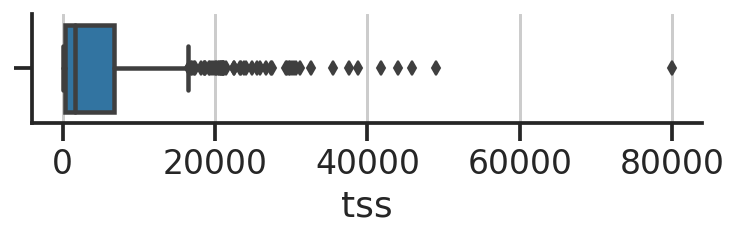

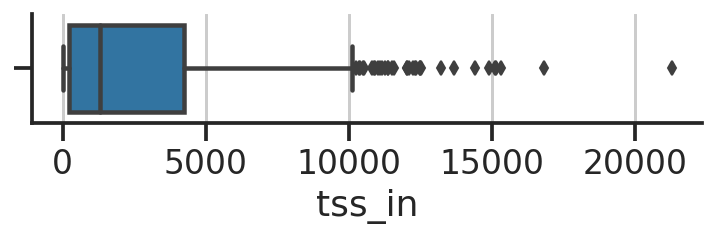

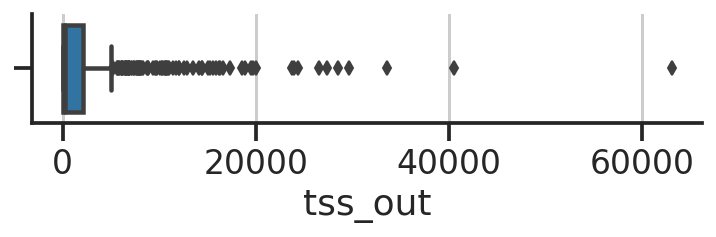

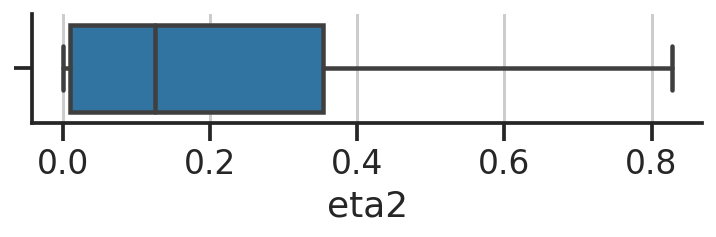

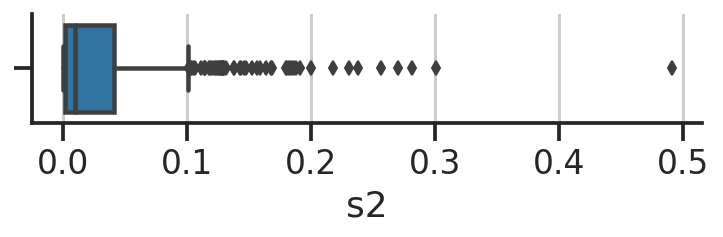

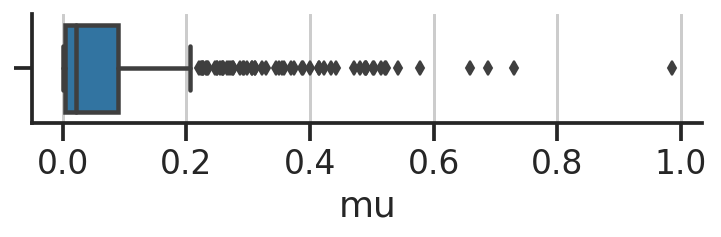

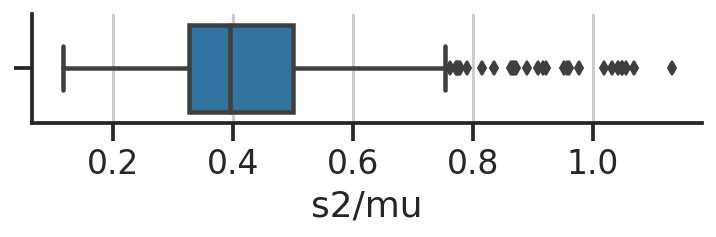

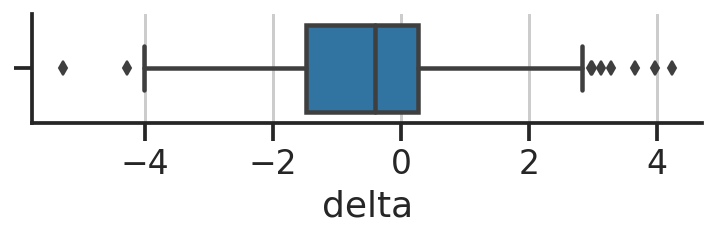

In [18]:
# 
for col in tss_df:
    fig, ax = plt.subplots(figsize=(6,1))
    sns.boxplot(tss_df[col], ax=ax)
    sns.despine(ax=ax)
    plt.show()

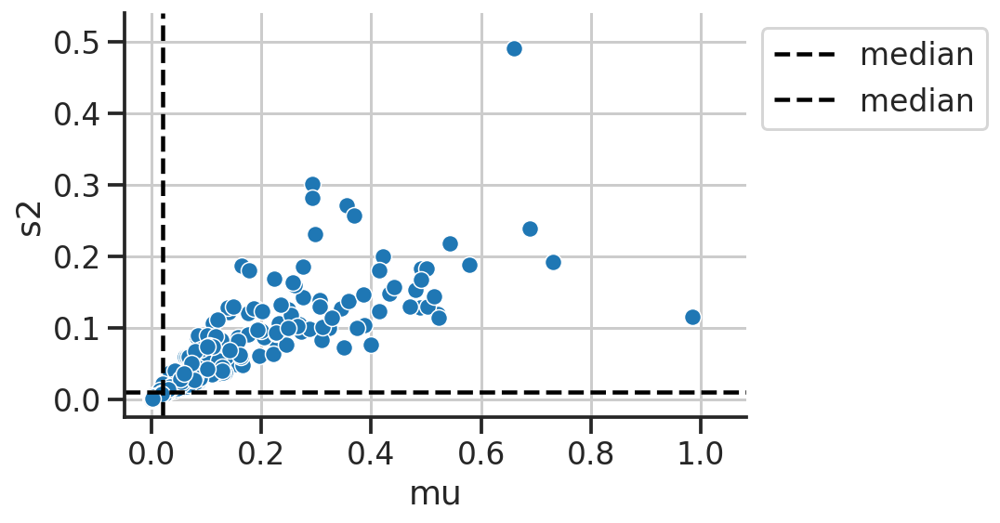

In [19]:
x, y, pdata = 'mu', 's2', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -0.05*ymax, 1.1*ymax

fig, ax = plt.subplots()
sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)

ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')

ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
sns.despine(ax=ax)
plt.show()

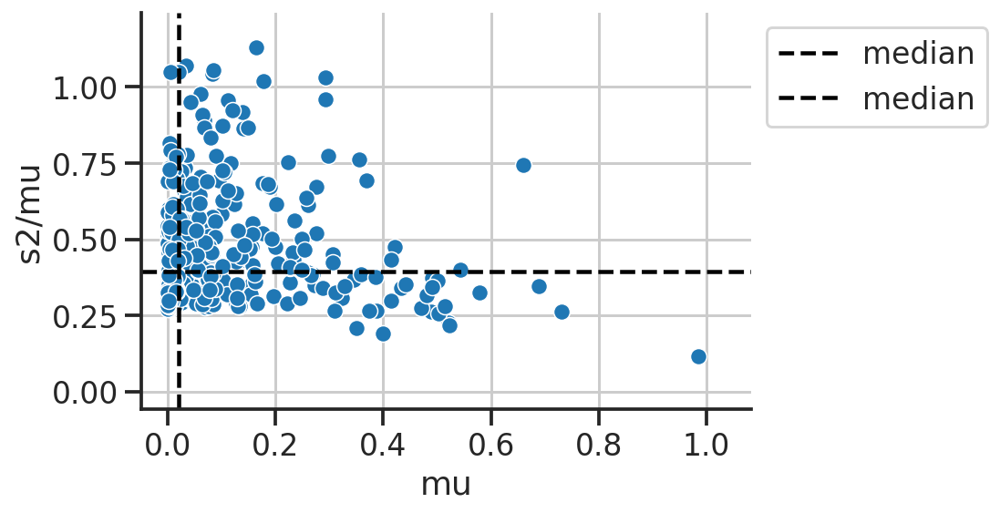

In [20]:
x, y, pdata = 'mu', 's2/mu', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -0.05*ymax, 1.1*ymax

fig, ax = plt.subplots()
sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)
ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
sns.despine(ax=ax)
plt.show()

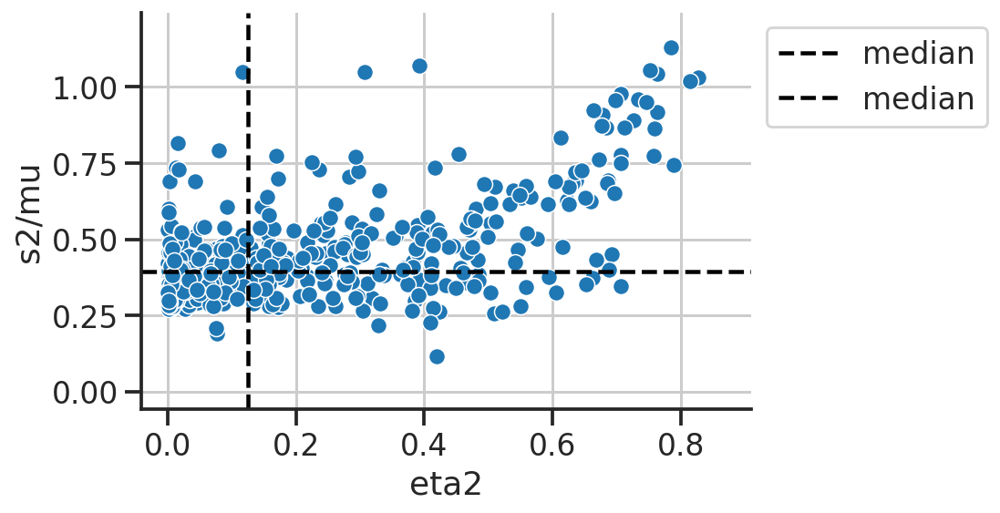

In [21]:
x, y, pdata = 'eta2', 's2/mu', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -0.05*ymax, 1.1*ymax

fig, ax = plt.subplots()
sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)
ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
sns.despine(ax=ax)
plt.show()

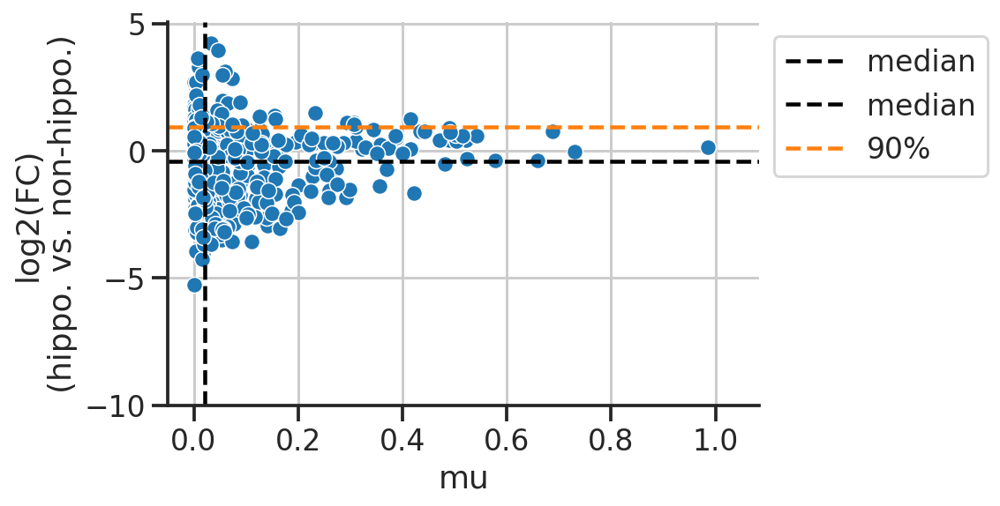

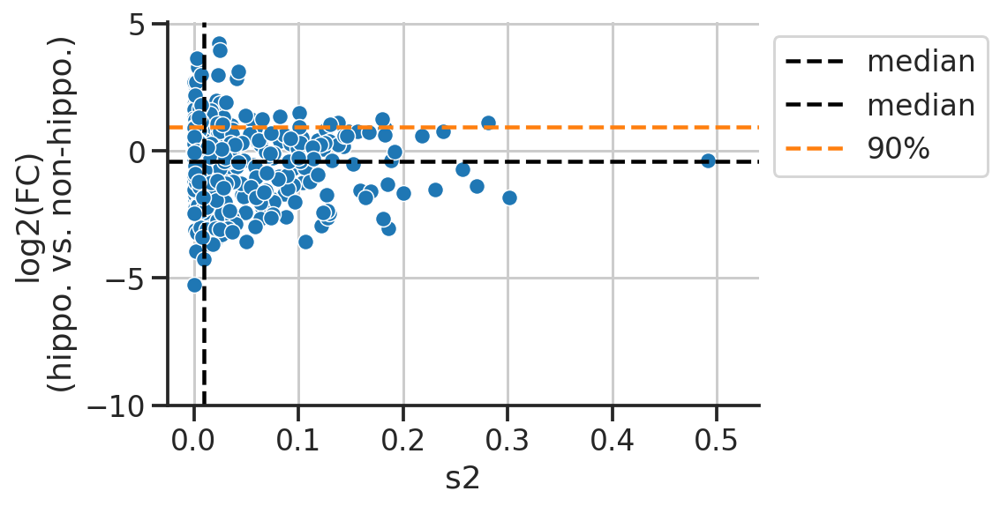

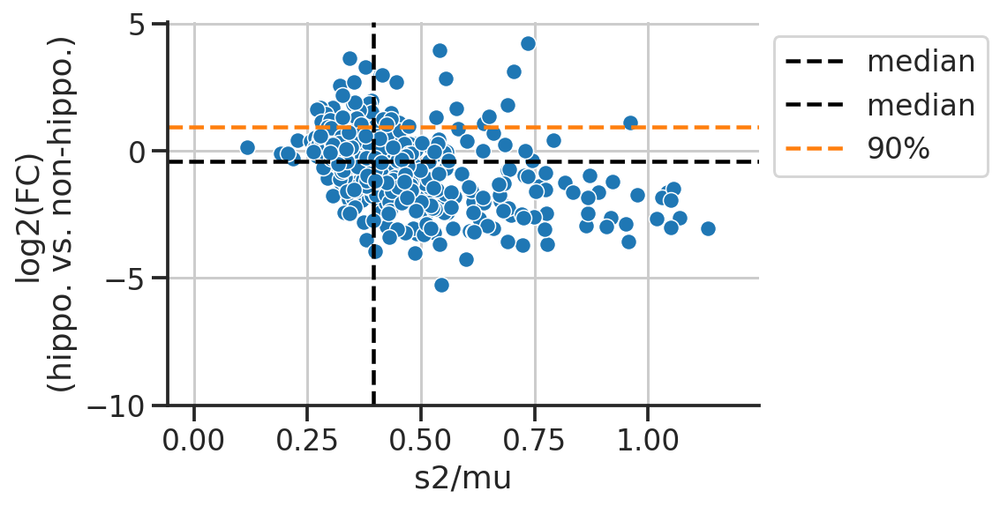

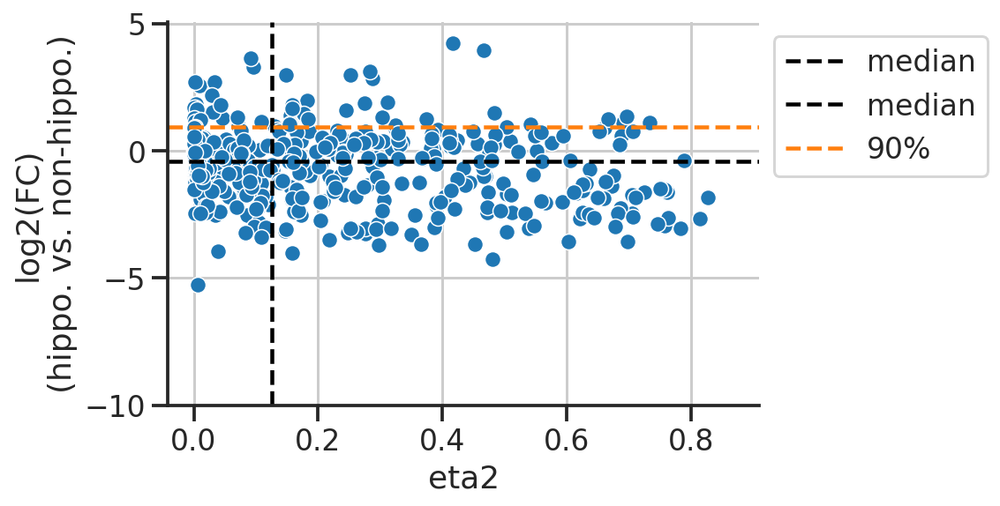

In [22]:
xs = ['mu', 's2', 's2/mu', 'eta2']
percentile_th = 90
for x in xs:
    x, y, pdata = x, 'delta', tss_df
    xmin, xmax = pdata[x].min(), pdata[x].max()
    ymin, ymax = pdata[y].min(), pdata[y].max()
    xmin, xmax = -0.05*xmax, 1.1*xmax
    ymin, ymax = -10, 1.2*ymax

    fig, ax = plt.subplots()
    sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)
    ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
#     ax.axvline(np.percentile(pdata[x], percentile_th), color='C1', linestyle='--', label='{}%'.format(percentile_th))
    ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
    ax.axhline(np.percentile(pdata[y], percentile_th), color='C1', linestyle='--', label='{}%'.format(percentile_th))
    
    ax.legend(bbox_to_anchor=(1,1), loc='upper left')
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    
    ax.set_ylabel('log2(FC)\n(hippo. vs. non-hippo.)')
    sns.despine(ax=ax)
    plt.show()

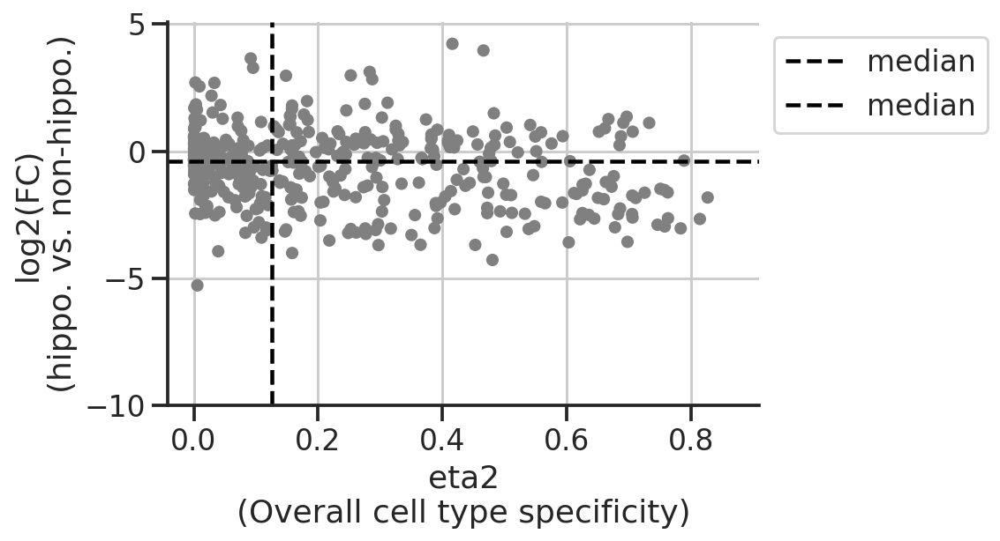

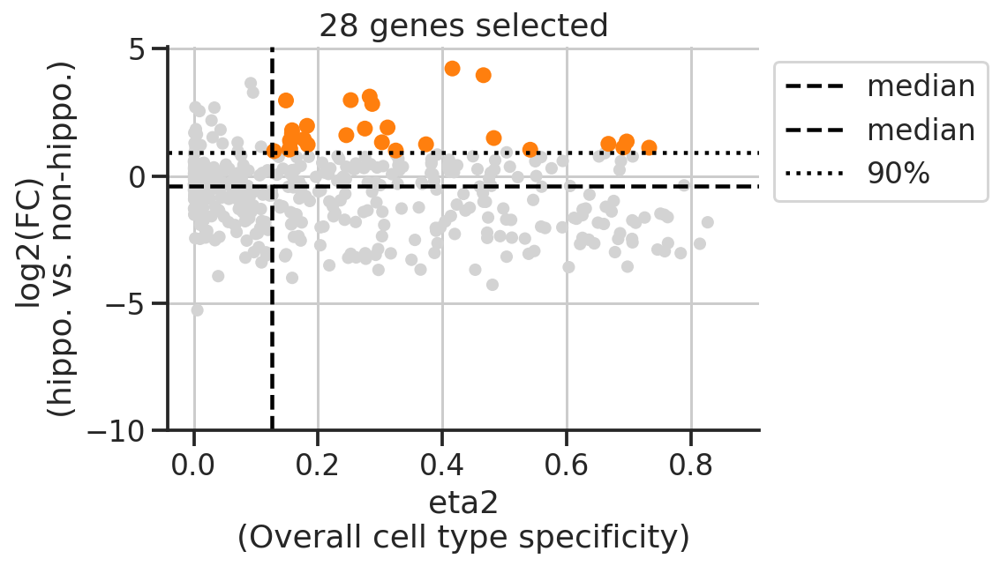

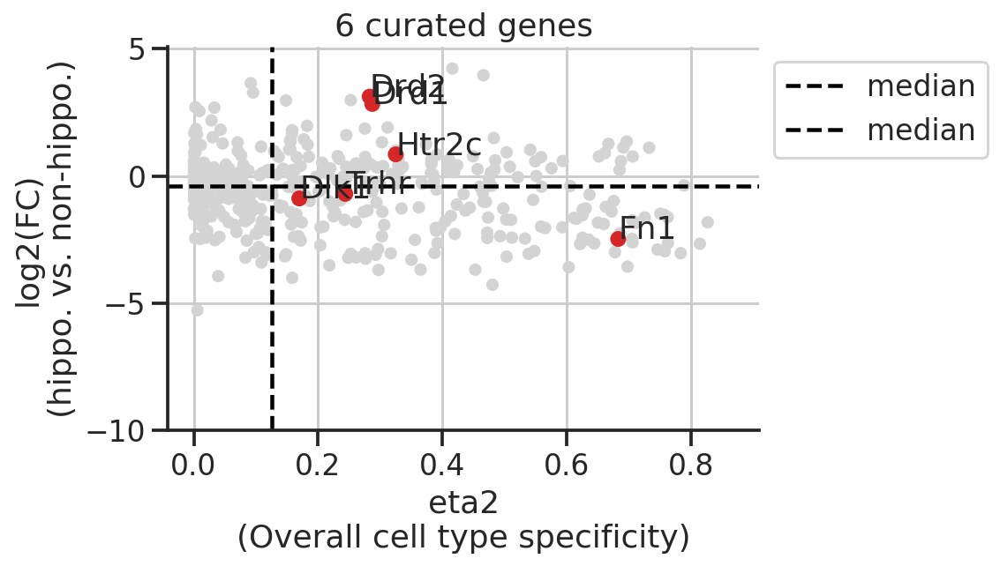

In [23]:
layers = [0,1,2]

percentile_th = 90
x, y, pdata = 'eta2', 'delta', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -10, 1.2*ymax


for layer in layers:
    fig, ax = plt.subplots()
    
    color = 'gray'
    if layer > 0:
        color = 'lightgray'
        
    sns.scatterplot(x=x, y=y, data=pdata, ax=ax, color=color, edgecolor='none', s=50)
    ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
    ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')

    if layer == 1:
        cutoffy = np.percentile(pdata[y], percentile_th)
        cutoffx = np.percentile(pdata[x], 50)
        ax.axhline(cutoffy, color='k', linestyle='dotted', label='{}%'.format(percentile_th))
        pdata_selected = pdata[((pdata[y]>cutoffy) & (pdata[x]>cutoffx))]
        sns.scatterplot(x=x, y=y, data=pdata_selected, ax=ax, color='C1', zorder=2, edgecolor='none')
        ax.set_title('{} genes selected'.format(len(pdata_selected)))
    if layer == 2:
        pdata_curated = pdata.loc[curated_genes_list]
        sns.scatterplot(x=x, y=y, data=pdata_curated, ax=ax, color='C3', zorder=2, edgecolor='none')
        ax.set_title('{} curated genes'.format(len(pdata_curated)))
        for gene_name, row in pdata_curated.iterrows():
            ax.text(row[x], row[y], gene_name)
        
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    ax.legend(bbox_to_anchor=(1,1), loc='upper left')

    ax.set_xlabel('eta2\n(Overall cell type specificity)')
    ax.set_ylabel('log2(FC)\n(hippo. vs. non-hippo.)')
    sns.despine(ax=ax)
    plt.show()

In [24]:
prioritized_genes = np.sort(pdata_selected.index.values)
print(prioritized_genes)

['Ackr2' 'Adora2a' 'Adra2b' 'Baiap2' 'Chrm1' 'Chrm4' 'Crhr1' 'Drd1' 'Drd2'
 'Epha3' 'Epha6' 'Gad1' 'Gpr101' 'Gpr149' 'Gpr26' 'Gpr52' 'Gpr83' 'Gpr88'
 'Grm4' 'Htr1b' 'Htr4' 'Man1a' 'Mchr1' 'Oprd1' 'Oprk1' 'P2ry1' 'Ptgdr'
 'Slc32a1']


In [25]:
np.intersect1d(curated_genes_list, prioritized_genes)

array(['Drd1', 'Drd2'], dtype=object)

## Visualize genes
- boxplot + UMAP + spatial

In [26]:
curated_genes_list

array(['Fn1', 'Dlk1', 'Htr2c', 'Trhr', 'Drd2', 'Drd1'], dtype=object)

../figures/2021-05-22_gene_view_Slice2_Replicate1_Epha7.pdf
../figures/2021-05-22_gene_view_Slice2_Replicate1_Epha7.png


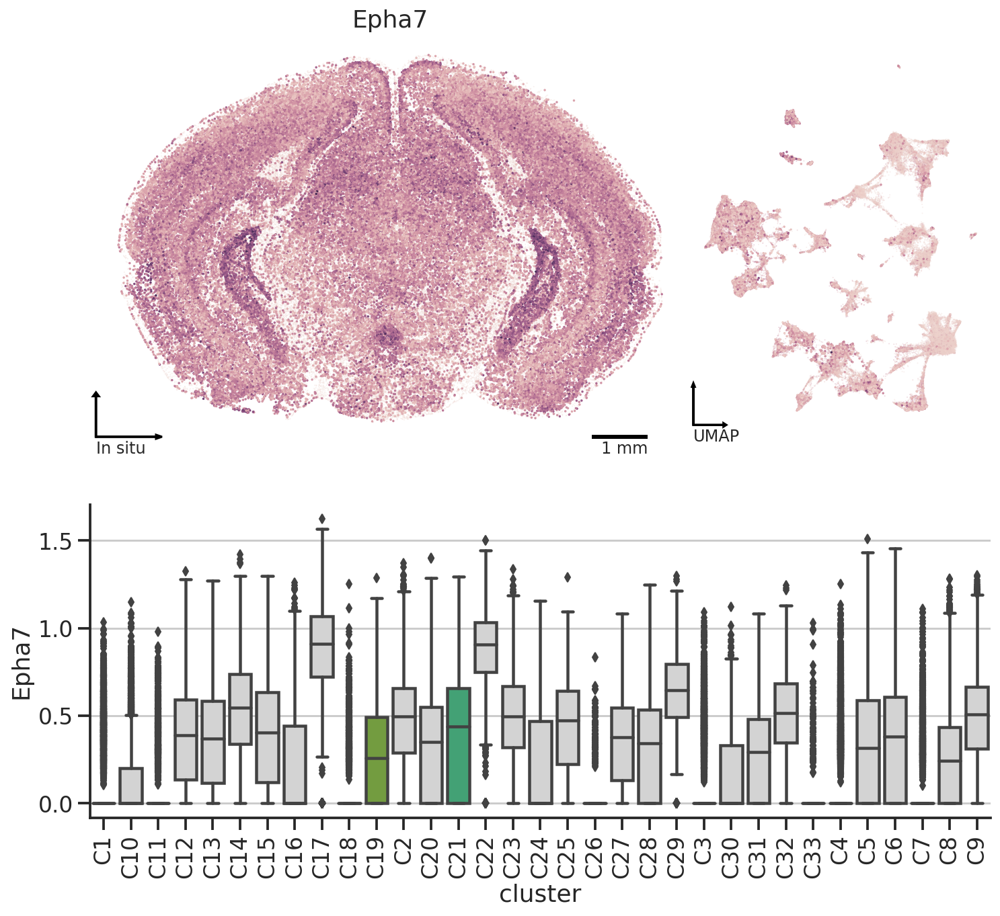

../figures/2021-05-22_gene_view_Slice2_Replicate1_Epha8.pdf
../figures/2021-05-22_gene_view_Slice2_Replicate1_Epha8.png


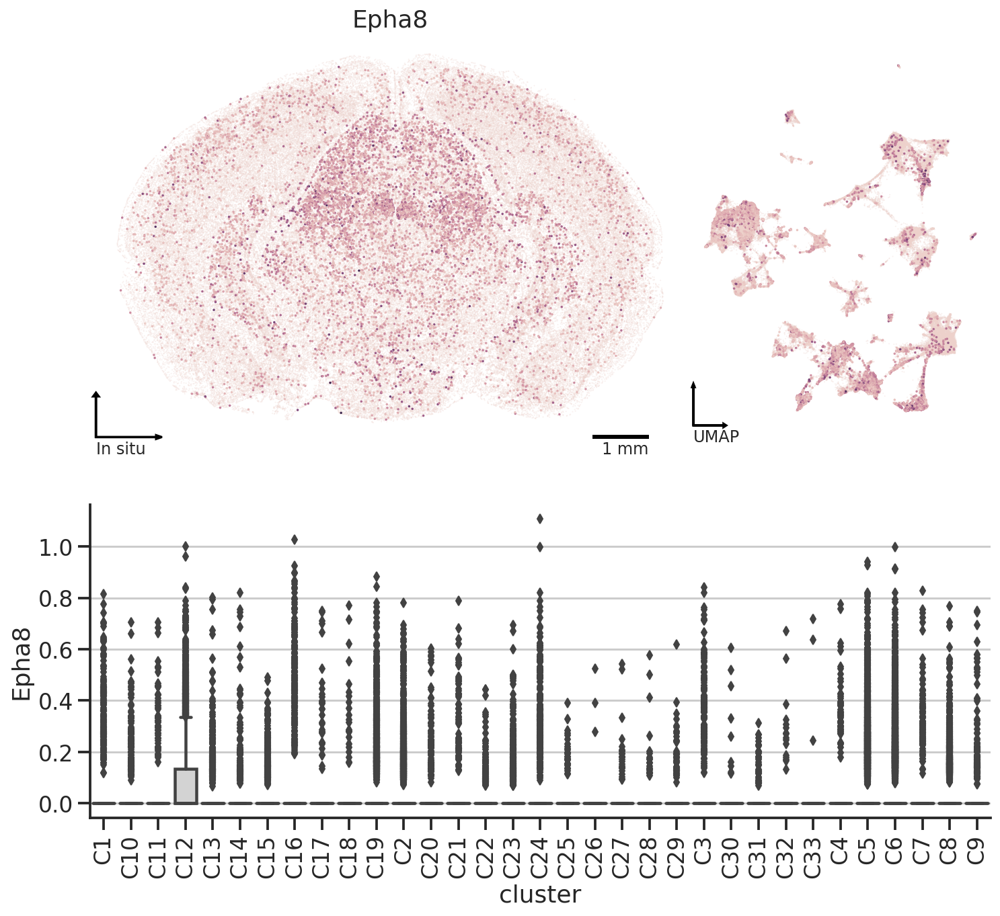

../figures/2021-05-22_gene_view_Slice2_Replicate1_Gpr161.pdf
../figures/2021-05-22_gene_view_Slice2_Replicate1_Gpr161.png


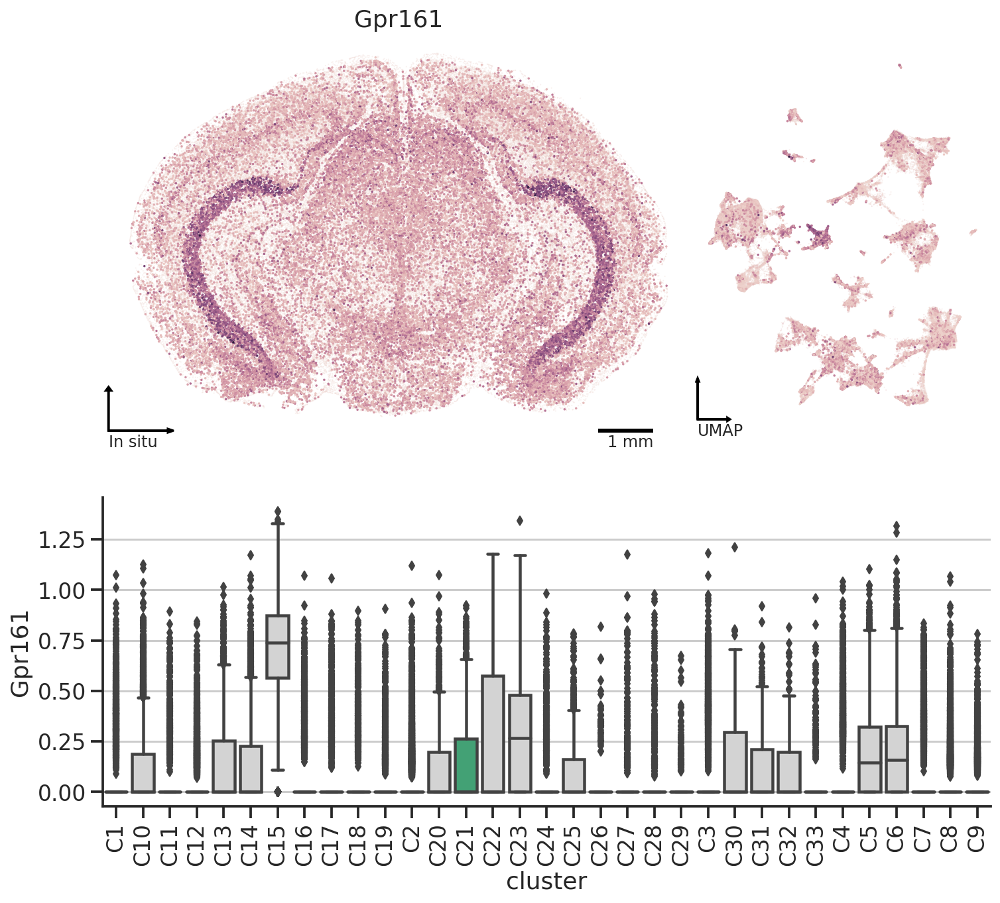

../figures/2021-05-22_gene_view_Slice2_Replicate1_Trhr.pdf
../figures/2021-05-22_gene_view_Slice2_Replicate1_Trhr.png


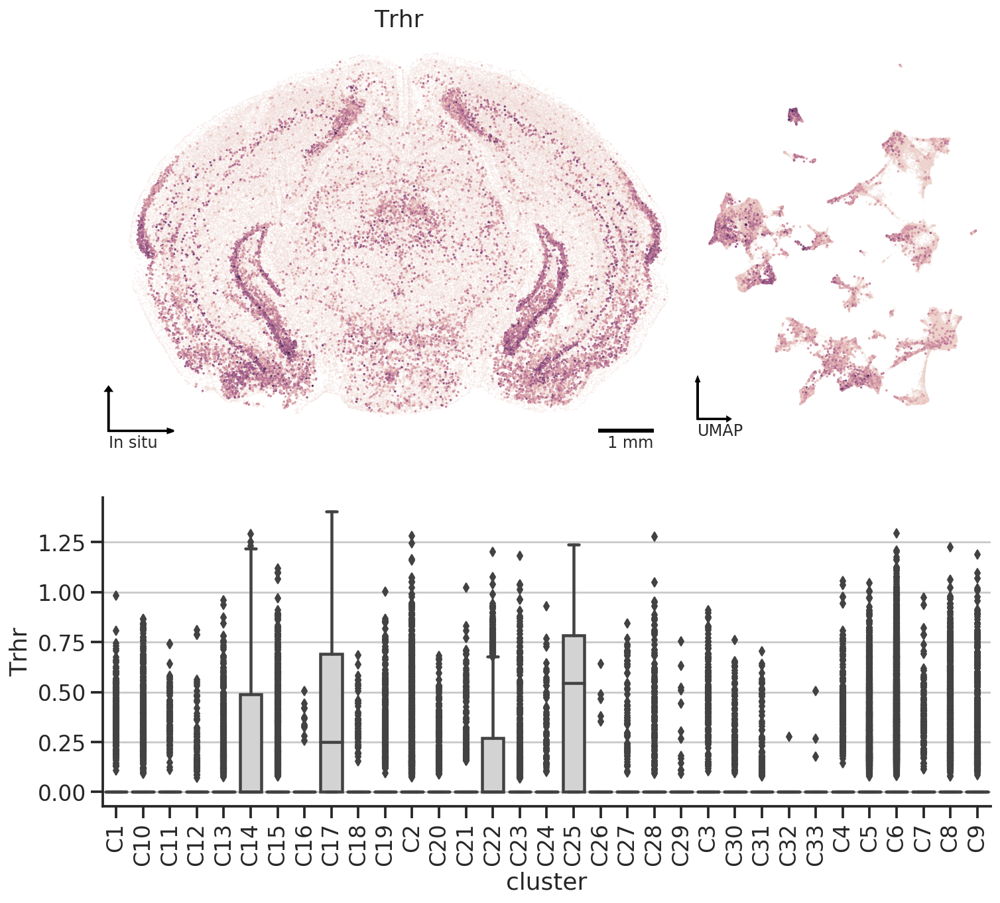

In [27]:
# gene_list = np.hstack([prioritized_genes, curated_genes_list])

toplot = thedata.join(gmat)

gene_list = ['Epha7', 'Epha8', 'Gpr161', 'Trhr']
for gene in gene_list:
    palette_specific = {_clst: palette_clsts[_clst] if _clst in selected_group else "lightgray" 
                            for _clst in uniq_clsts} 
    x_spatial, y_spatial = 'x', 'y'
    x_umap, y_umap = 'umap_1', 'umap_2'
    hue = gene
    fontsize = 12
    x_box, y_box = 'cluster', gene
    vmaxp = 95
    pth = 90
    
    fig = plt.figure(figsize=(12,12))
    specs = gridspec.GridSpec(nrows=3, ncols=3)
    
    # in-situ
    ax = fig.add_subplot(specs[:2,:2])  
    title = gene
    plot_continuous_spatial_routine(
        ax, x_spatial, y_spatial, hue, toplot, 
        vmaxp=vmaxp,
        title=title, fontsize=fontsize,
    )
    
    # UMAP 
    ax = fig.add_subplot(specs[:2,2])  
    plot_continuous_umap_routine(
        ax, x_umap, y_umap, hue, toplot, 
        vmaxp=vmaxp,
        title='', fontsize=fontsize,
        pth=pth,
    )
    
    # boxplot
    ax = fig.add_subplot(specs[2,:])  
    sns.boxplot(x=x_box, y=y_box, data=toplot, 
                ax=ax, 
                palette=palette_specific, 
                order=np.sort(toplot[x_box].unique()),
               )
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    sns.despine(ax=ax)
    
    fig.subplots_adjust(wspace=0, hspace=-0.1)
    
    output1 = figures.format('gene_view_{}_{}.pdf'.format(sample, gene))
    output2 = figures.format('gene_view_{}_{}.png'.format(sample, gene))
    for output in [output1, output2]:
        print(output)
        snmcseq_utils.savefig(fig, output)
    plt.show()
    

In [28]:
# group cell level into clsuter level
gmat_group = gmat.join(clsts['cluster']).groupby('cluster').mean()
# zscore per gene
gmat_group = (gmat_group - gmat_group.mean())/gmat_group.std()

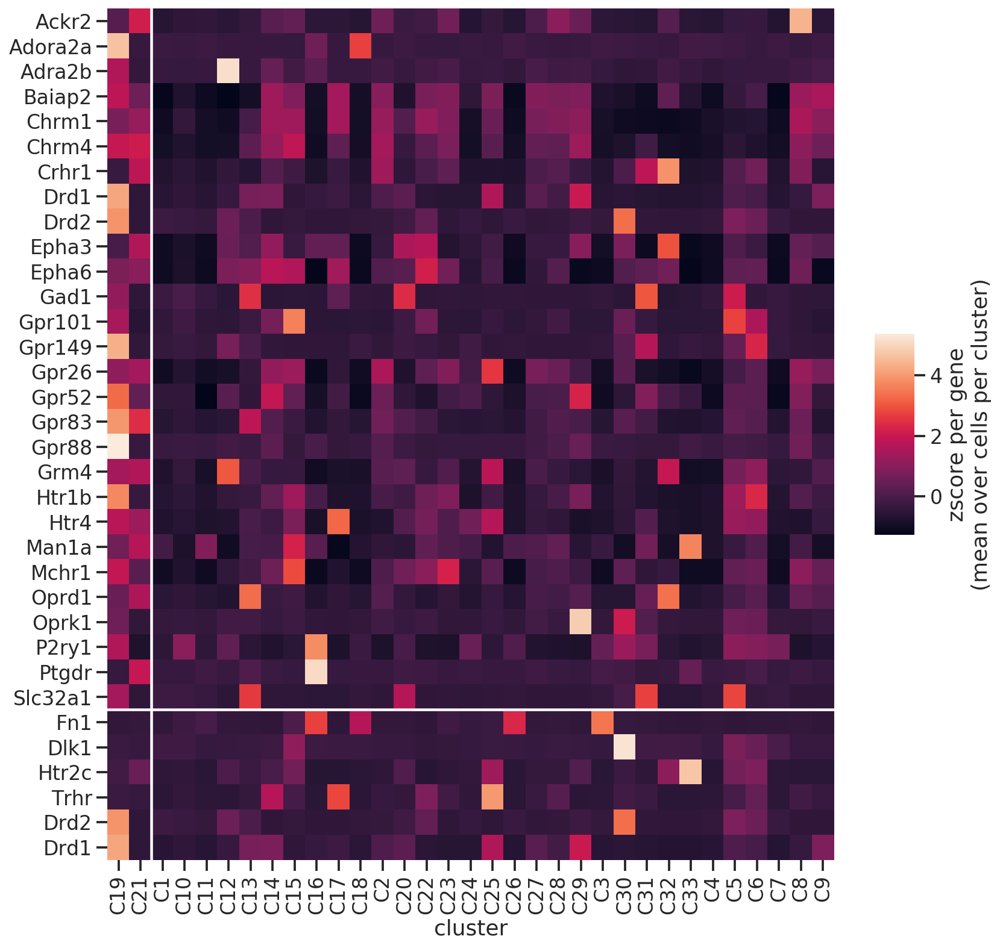

In [29]:

heatmap = gmat_group[np.hstack([prioritized_genes, curated_genes_list])].T

cols = heatmap.columns
cols = np.hstack([selected_group, cols.drop(selected_group)])
heatmap = heatmap[cols]

cbar_kws = DEFAULT_COLORBAR_KWS.copy()
cbar_kws['label'] = 'zscore per gene\n(mean over cells per cluster)'

fig, ax = plt.subplots(figsize=(12, 13))
sns.heatmap(heatmap, ax=ax, cbar_kws=cbar_kws)
ax.axhline(len(prioritized_genes), color='white')
ax.axvline(len(selected_group), color='white')
plt.show()

# Genes

In [30]:
genes

Index(['Oxgr1', 'Htr1a', 'Htr1b', 'Htr1d', 'Htr1f', 'Htr2a', 'Htr2b', 'Htr2c',
       'Htr4', 'Htr5a',
       ...
       'Pdgfrb', 'Ptk7', 'Ret', 'Ror1', 'Ror2', 'Ros1', 'Ryk', 'Tek', 'Tie1',
       'Tyro3'],
      dtype='object', length=483)

In [31]:
print(np.sort(genes).tolist())

['ADGRF3', 'Abcc9', 'Ackr1', 'Ackr2', 'Ackr3', 'Ackr4', 'Acte1', 'Adcyap1r1', 'Adgra1', 'Adgra2', 'Adgra3', 'Adgrb1', 'Adgrb3', 'Adgrd1', 'Adgre1', 'Adgre4', 'Adgrf1', 'Adgrf2', 'Adgrf4', 'Adgrf5', 'Adgrg1', 'Adgrg2', 'Adgrg4', 'Adgrg5', 'Adgrg6', 'Adgrg7', 'Adgrl1', 'Adgrl2', 'Adgrl3', 'Adgrl4', 'Adgrv1', 'Adora1', 'Adora2a', 'Adora2b', 'Adora3', 'Adra1a', 'Adra1b', 'Adra1d', 'Adra2a', 'Adra2b', 'Adra2c', 'Adrb1', 'Adrb2', 'Adrb3', 'Agtr1a', 'Agtr1b', 'Agtr2', 'Aldh1l1', 'Alk', 'Amigo2', 'Anxa11', 'Aplnr', 'Aqp4', 'Arhgap29', 'Ascl1', 'Atp13a5', 'Avpr1a', 'Avpr1b', 'Avpr2', 'Axl', 'Baiap2', 'Bdkrb1', 'Bdkrb2', 'Brs3', 'C1qa', 'C1qb', 'C3ar1', 'C5ar1', 'C5ar2', 'Calcr', 'Calcrl', 'Casr', 'Cckar', 'Cckbr', 'Ccr1', 'Ccr10', 'Ccr1l1', 'Ccr2', 'Ccr3', 'Ccr4', 'Ccr6', 'Ccr7', 'Ccr8', 'Ccr9', 'Ccrl2', 'Cd300c2', 'Celsr1', 'Celsr2', 'Celsr3', 'Cenpe', 'Chat', 'Chrm1', 'Chrm2', 'Chrm3', 'Chrm4', 'Chrm5', 'Cldn19', 'Cldn5', 'Cmklr1', 'Cnr1', 'Cnr2', 'Crhr1', 'Crhr2', 'Csf1r', 'Cspg5', 'Cx3cl1',

In [32]:
client = snmcseq_utils.setup_googlesheet()
df = snmcseq_utils.read_googlesheet('Zhang_Keown_Mukamel_Meaney', 'Differential Expression')
df = pd.DataFrame(df.loc[2:].iloc[:,:7].values, columns=df.loc[1].iloc[:7]).groupby('Gene').first().drop('ID', axis=1)
df = df.astype(np.float64)
print(df.shape)
df.head()

(16972, 5)


1,log2(CPM),log2(FCdDG_in_EE),logFCdDG_in_SH,PValuedDG,QValuedDG
Gene,,,,,
#N/A,4.58,-0.43,-0.411478,2.600000e-05,8.700000e-05
0610007P14Rik,4.93,0.01,-0.195218,4.500000e-02,8.000000e-02
0610009B22Rik,3.95,-0.34,-0.234539,7.200000e-08,3.600000e-07
0610009E02Rik,-0.34,0.30,-0.336310,2.100000e-01,2.900000e-01
0610009L18Rik,1.90,-0.17,-0.280521,3.300000e-02,6.100000e-02


In [33]:
df_up = df[((df['QValuedDG']<0.05) & (df['logFCdDG_in_SH']>0))].sort_values('QValuedDG')
df_down = df[((df['QValuedDG']<0.05) & (df['logFCdDG_in_SH']<0))].sort_values('QValuedDG')
print(df_up.shape, df_down.shape)

(4352, 5) (4682, 5)


In [34]:
upgenes = np.intersect1d(genes, df_up.index.values)
print(upgenes.shape)
upgenes

(85,)


array(['Adgra2', 'Adgrb3', 'Adgrl1', 'Adgrl3', 'Adora2a', 'Adra1a',
       'Adra1b', 'Adra2b', 'Adra2c', 'Anxa11', 'Ascl1', 'Baiap2', 'Cckbr',
       'Celsr2', 'Celsr3', 'Chrm1', 'Chrm3', 'Cx3cl1', 'Cxcl12', 'Ddr1',
       'Drd1', 'Drd5', 'Ednra', 'Eomes', 'Epha10', 'Epha4', 'Epha5',
       'Epha6', 'Epha7', 'Epha8', 'Ephb1', 'Ephb2', 'Erbb3', 'Fzd10',
       'Fzd2', 'Fzd4', 'Fzd5', 'Fzd8', 'Gabbr2', 'Gad1', 'Gpr135',
       'Gpr146', 'Gpr151', 'Gpr153', 'Gpr173', 'Gpr176', 'Gpr26', 'Gpr27',
       'Gpr37', 'Gpr61', 'Gpr63', 'Gpr75', 'Gpr83', 'Gpr85', 'Gprc5b',
       'Gprc5c', 'Grin2b', 'Grm1', 'Grm2', 'Grm7', 'Htr2a', 'Htr4',
       'Igf1r', 'Igfbpl1', 'Insr', 'Lpar4', 'Lpar6', 'Mas1', 'Mki67',
       'Nmbr', 'Npy1r', 'Ntrk3', 'Oprd1', 'Pdgfrb', 'Peg10', 'Rrh', 'Ryk',
       'Sema4d', 'Slc17a6', 'Slc17a8', 'Sox8', 'Sstr2', 'Tas1r3',
       'Tmem108', 'Top2a'], dtype=object)

In [35]:
downgenes = np.intersect1d(genes, df_down.index.values)
print(downgenes.shape)
downgenes

(106,)


array(['Adgra1', 'Adgra3', 'Adgrf4', 'Adgrg1', 'Adora2b', 'Adra1d',
       'Adra2a', 'Agtr2', 'Aldh1l1', 'Amigo2', 'Atp13a5', 'Calcrl',
       'Cenpe', 'Chrm4', 'Chrm5', 'Cnr1', 'Crhr1', 'Cspg5', 'Ddr2',
       'Dlk1', 'Ednrb', 'Efemp1', 'Egfr', 'Ephb3', 'Ephb6', 'Erbb2',
       'Erbb4', 'F2r', 'Fgfr2', 'Fgfr3', 'Fgfrl1', 'Fzd9', 'Galr1',
       'Glp1r', 'Glp2r', 'Gper1', 'Gpr1', 'Gpr101', 'Gpr149', 'Gpr150',
       'Gpr161', 'Gpr162', 'Gpr34', 'Gpr45', 'Gpr88', 'Gramd3', 'Grm3',
       'Hcar1', 'Hcrtr1', 'Hcrtr2', 'Hrh1', 'Hrh2', 'Hrh3', 'Htr1a',
       'Htr2c', 'Htr7', 'Kiss1r', 'Kit', 'Lgr5', 'Man1a', 'Mchr1',
       'Mertk', 'Met', 'Mlc1', 'Mrgpre', 'Musk', 'Npbwr1', 'Npy2r',
       'Nrp1', 'Ntrk2', 'Ntsr1', 'Ntsr2', 'Olig1', 'Oprk1', 'Oprm1',
       'Oxtr', 'Pcdh15', 'Pdgfra', 'Pln', 'Ptger2', 'Ptger4', 'Pth1r',
       'Qrfpr', 'Ror2', 'Rspo3', 'Rxfp1', 'Rxfp3', 'S1pr1', 'Sctr',
       'Slc17a7', 'Slc25a18', 'Smo', 'Sox9', 'Sstr1', 'Sstr3', 'Sstr4',
       'Syt4', 'Tacr1', 'Tacr3'